## Test for 2D field visualization

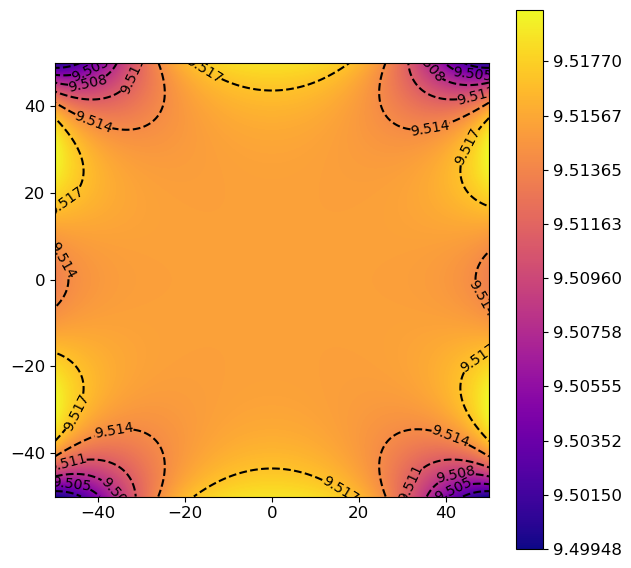

In [25]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, make_grid
# get_grid_nonuniformity,
from maggeometry import four_rings
import magpylib as magpy
from magpylib.magnet import CylinderSegment
from alive_progress import alive_bar
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def make_xz_grid(x_grid_bounds, z_grid_bounds, grid_res):
    ts_x = np.linspace(x_grid_bounds[0], x_grid_bounds[1], grid_res)
    ts_z = np.linspace(z_grid_bounds[0], z_grid_bounds[1], grid_res)
    grid = np.array([[(x,0,z) for x in ts_x] for z in ts_z])
    return ts_x, ts_z, grid

def get_grid_nonuniformity(magnets, grid, grid_res):
    mT_to_G = 10
    B = magnets.getB(grid)
    G = B * mT_to_G
    # find magnitude of the b-field at all points over grid
    Gmag_all = np.sqrt(G[:,:,0]**2 + G[:,:,1]**2 + G[:,:,2]**2)
    Gmag = G[:,:,2]
    # find magnitude of b-field at center of grid
    mid_id = int(grid_res/2)
    Gcenter = Gmag[mid_id][mid_id]
    # calculate nonuniformity with respect to center b-field
    Gnon = np.abs((Gmag - Gcenter)/Gcenter)
    max_nonuniformity = np.max(Gnon)
    av_nonuniformity = np.sum(Gnon) / grid_res**2
    return G, Gmag_all, Gmag, Gnon, Gcenter, av_nonuniformity, max_nonuniformity

Br = 1.09e3
grid_res = 501
d = 50
h = 50
X, Z, grid = make_xz_grid([-d, d], [-h, h], grid_res)

x = [144.38226051, 51.11048466, 19.94272085, 2, 155.70613803, 183.10542199]

innerrad1, innerrad2, width, thickness, dist1, dist2 = x
magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)
gplain, gall, gmag, grid_field, center_field, av_nonuniformity, max_abs_nonuniformity = get_grid_nonuniformity(magnets, grid, grid_res)
# print (gall)
# print (gmag)
# print (gplain)
plt.figure(figsize=(7,7))
ap = plt.contourf(X, Z, gall, levels=1000, cmap=cm.plasma)
# ap = plt.contourf(X, Z, gall, cmap=cm.plasma)
# cp = plt.contour(X, Z, gall, levels=7, colors='black')
cp = plt.contour(X, Z, gall, colors='black', linestyles='dashed')
plt.clabel(cp, fontsize=10, colors='black')
plt.colorbar(ap)
plt.gca().set_aspect('equal')

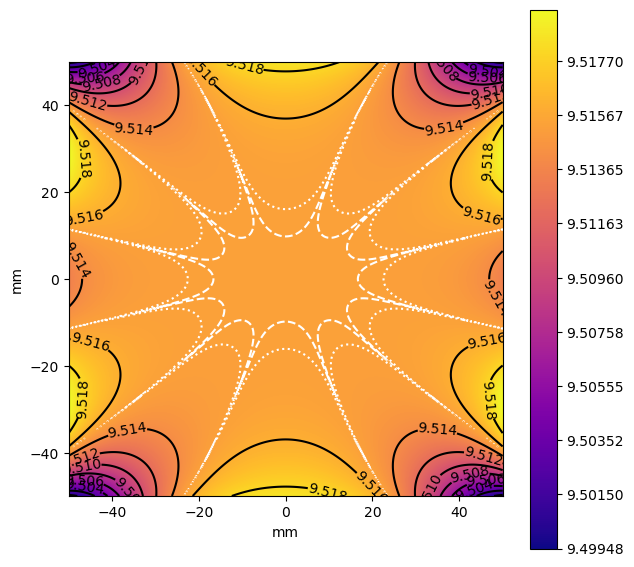

In [1]:
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, make_grid, plot_uniform_region_side_view
from maggeometry import four_rings
d = 50
h = 50
x = [144.38226051, 51.11048466, 19.94272085, 2, 155.70613803, 183.10542199]
Br = 1.09e3
innerrad1, innerrad2, width, thickness, dist1, dist2 = x
magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)
plot_uniform_region_side_view(magnets, [-d, d], [-h, h])

In [3]:
grid_res = 501
mid_id = int(grid_res/2)
Gcenter = gall[mid_id][mid_id]
# calculate nonuniformity with respect to center b-field
Gnon = np.abs((gall - Gcenter)/Gcenter)
# lvls = np.logspace(-7, -4, num=4)
lvls = [1e-7, 1e-6]
plt.figure(figsize=(7,7))
ap = plt.contourf(X, Z, Gnon, levels=1000, cmap=cm.plasma)
# ap = plt.contourf(X, Z, Gnon, cmap=cm.plasma)
cp = plt.contour(X, Z, Gnon, levels=lvls, colors='white')
plt.clabel(cp, fontsize=5, colors='white')
plt.colorbar(ap)
plt.gca().set_aspect('equal')

NameError: name 'gall' is not defined

On x-axis:
Maximum B-field: 9.515 G
Central B-field: 9.515 G
Min nonuniformity: 0.0
Max nonuniformity:6.9941993394519e-06


On y-axis:
Maximum B-field: 9.515 G
Central B-field: 9.515 G
Min nonuniformity: 0.0
Max nonuniformity:6.9941993394519e-06


On z-axis:
Maximum B-field: 9.515 G
Central B-field: 9.515 G
Min nonuniformity: 0.0
Max nonuniformity:2.645784499386753e-05




/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:188: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[3].set_ylim(x_min_nonuniformity - 1e-7, x_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:194: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[4].set_ylim(y_min_nonuniformity - 1e-7, y_max_nonuniformity + 1e-7)
/Users/nelson/Documents/quantum/quantum_notes/projects/b_field/simulations/b-field-uniformity/maghelper.py:200: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[5].set_ylim(z_min_nonuniformity - 1e-7, z_max_nonuniformity + 1e-7)


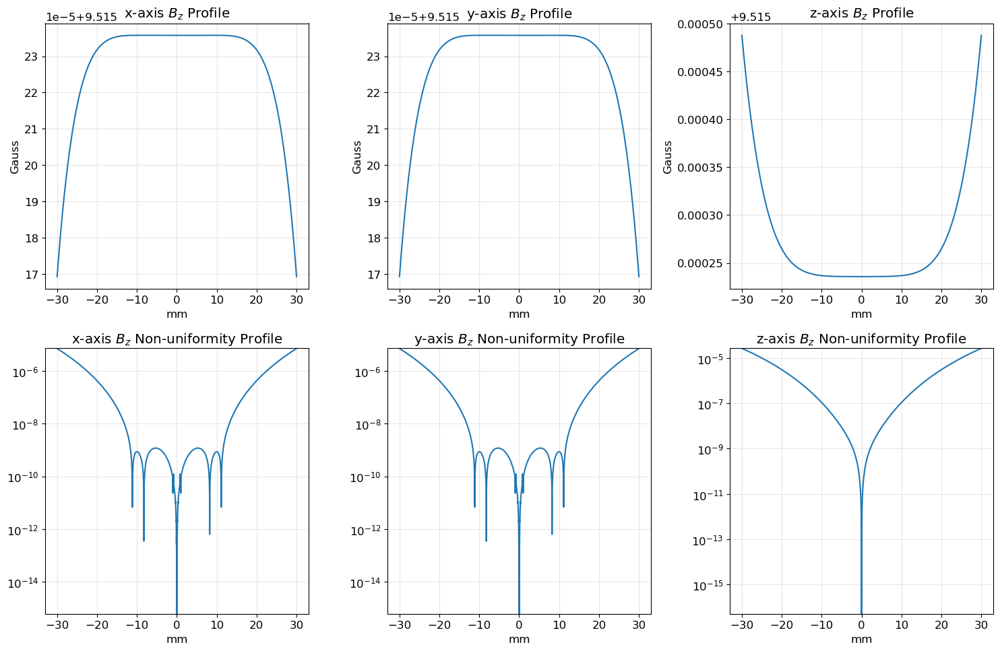

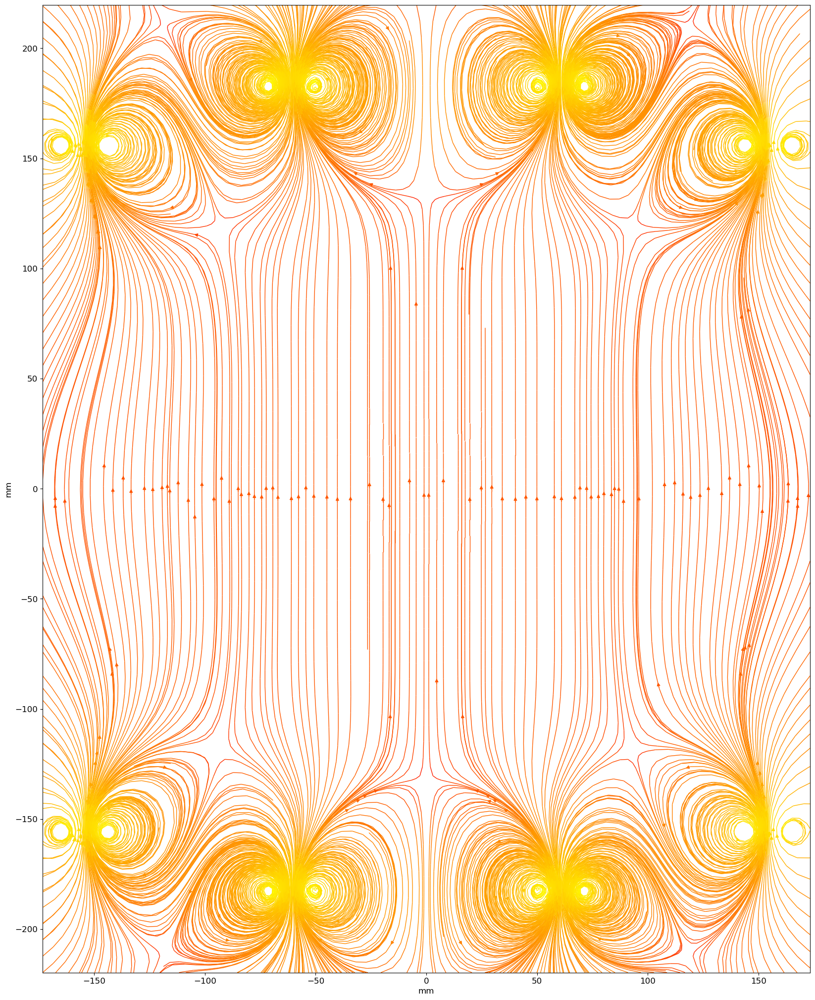

In [2]:
sens_len = 30
get_field_on_axes(magnets, [[-sens_len, sens_len], [-sens_len, sens_len], [-sens_len, sens_len]], True)
x_bounds = [-1.2*innerrad1, 1.2*innerrad1]
z_bounds = [-1.2*dist2, 1.2*dist2]

make_flux_stream(magnets, x_bounds, z_bounds, [])

# Test for 3D field visualization

In [13]:
import numpy as np
import magpylib as magpy
import pyvista as pv

pv.set_jupyter_backend('client') # improve rending in a jupyter notebook
# pv.set_jupyter_backend("tram") # improve rending in a jupyter notebook

coil1 = magpy.Collection()
for z in np.linspace(-8, 8, 16):
    winding = magpy.current.Loop(
        current=100,
        diameter=10,
        position=(0,0,z),
    )
    coil1.add(winding)

grid = pv.ImageData(
    dimensions=(41, 41, 41),
    spacing=(2, 2, 2),
    origin=(-40, -40, -40),
)

# compute B-field and add as data to grid
grid['B'] = coil1.getB(grid.points)

# compute field lines
seed = pv.Disc(inner=1, outer=5.2, r_res=3, c_res=12)
strl = grid.streamlines_from_source(
    seed,
    vectors='B',
    max_time=180,
    initial_step_length=0.01,
    integration_direction='both',
)

# create plotting scene
pl = pv.Plotter()

# add field lines and legend to scene
legend_args = {
    'title': 'B [mT]',
    'title_font_size': 20,
    'color': 'black',
    'position_y': 0.25,
    'vertical': True,
}

# draw coils
magpy.show(coil1, canvas=pl, backend='pyvista')

# add streamlines
pl.add_mesh(
    strl.tube(radius=.2),
    cmap="bwr",
    scalar_bar_args=legend_args,
)
# display scene
pl.camera.position=(160, 10, -10)
pl.set_background("white")
pl.show()

Widget(value="<iframe src='http://localhost:52453/index.html?ui=P_0x32cde3150_12&reconnect=auto' style='width:…

In [2]:
import numpy as np
import magpylib as magpy
import pyvista as pv
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, make_grid
from maggeometry import four_rings
import magpylib as magpy

pv.set_jupyter_backend('client') # improve rending in a jupyter notebook
# pv.set_jupyter_backend("tram") # improve rending in a jupyter notebook
Br = 1.09e3
x = [144.38226051, 51.11048466, 19.94272085, 2, 155.70613803, 183.10542199]

innerrad1, innerrad2, width, thickness, dist1, dist2 = x
magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)

grid = pv.ImageData(
    dimensions=(151, 151, 151),
    spacing=(2, 2, 2),
    origin=(-150, -150, -150),
)

# compute B-field and add as data to grid
grid['B'] = magnets.getB(grid.points)

# compute field lines
seed = pv.Disc(inner=1, outer=150.2, r_res=5, c_res=12)
strl = grid.streamlines_from_source(
    seed,
    vectors='B',
    max_time=400,
    initial_step_length=0.01,
    integration_direction='both',
)

# create plotting scene
pl = pv.Plotter()

# add field lines and legend to scene
legend_args = {
    'title': 'B [mT]',
    'title_font_size': 20,
    'color': 'black',
    'position_y': 0.25,
    'vertical': True,
}

# draw coils
magpy.show(magnets, canvas=pl, backend='pyvista')

# add streamlines
pl.add_mesh(
    strl.tube(radius=.2),
    cmap="bwr",
    scalar_bar_args=legend_args,
)
# display scene
pl.camera.position=(160, 10, -10)
pl.set_background("white")
pl.show()

Widget(value="<iframe src='http://localhost:54494/index.html?ui=P_0x17bfc8ed0_0&reconnect=auto' style='width: …

In [8]:
print(grid['B'])
print(grid.dimensions)
print(grid.extent)
# grid['B_str'] = 
a = grid['B'][:,0]**2 + grid['B'][:,1]**2
print(a)

[[-0.27566913 -0.27566913 -1.86042661]
 [-0.29795925 -0.30198572 -1.95914298]
 [-0.32220974 -0.33103741 -2.06486096]
 ...
 [-0.32220974 -0.33103741 -2.06486096]
 [-0.29795925 -0.30198572 -1.95914298]
 [-0.27566913 -0.27566913 -1.86042661]]
(151, 151, 151)
(0, 150, 0, 150, 0, 150)
[0.15198694 0.17997509 0.21340488 ... 0.21340488 0.17997509 0.15198694]


# 3D grid test

In [2]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, make_grid
# get_grid_nonuniformity,
from maggeometry import four_rings
import magpylib as magpy
from magpylib.magnet import CylinderSegment
from alive_progress import alive_bar
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def make_xyz_grid(x_grid_bounds, y_grid_bounds, z_grid_bounds, grid_res):
    ts_x = np.linspace(x_grid_bounds[0], x_grid_bounds[1], grid_res)
    ts_y = np.linspace(y_grid_bounds[0], y_grid_bounds[1], grid_res)
    ts_z = np.linspace(z_grid_bounds[0], z_grid_bounds[1], grid_res)
    grid = np.array([[[(x,y,z) for x in ts_x] for y in ts_y]for z in ts_z])
    return ts_x, ts_y, ts_z, grid
d = 50
h = 50
b = 50
grid_res = 101
X, Y, Z, grid = make_xyz_grid([-d, d], [-b, b], [-h, h], grid_res)
Br = 1.09e3
x = [144.38226051, 51.11048466, 19.94272085, 2, 155.70613803, 183.10542199]

innerrad1, innerrad2, width, thickness, dist1, dist2 = x
magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)

B = magpy.getB(magnets, grid)
# print(B)
B.shape

(101, 101, 101, 3)

[[0.9499496  0.94996992 0.95000045 ... 0.95000045 0.94996992 0.9499496 ]
 [0.95015464 0.95016125 0.95017819 ... 0.95017819 0.95016125 0.95015464]
 [0.9503482  0.95034256 0.95034727 ... 0.95034727 0.95034256 0.9503482 ]
 ...
 [0.9503482  0.95034256 0.95034727 ... 0.95034727 0.95034256 0.9503482 ]
 [0.95015464 0.95016125 0.95017819 ... 0.95017819 0.95016125 0.95015464]
 [0.9499496  0.94996992 0.95000045 ... 0.95000045 0.94996992 0.9499496 ]]
[[0.9499496  0.94996992 0.95000045 ... 0.95000045 0.94996992 0.9499496 ]
 [0.95015464 0.95016125 0.95017819 ... 0.95017819 0.95016125 0.95015464]
 [0.9503482  0.95034256 0.95034727 ... 0.95034727 0.95034256 0.9503482 ]
 ...
 [0.9503482  0.95034256 0.95034727 ... 0.95034727 0.95034256 0.9503482 ]
 [0.95015464 0.95016125 0.95017819 ... 0.95017819 0.95016125 0.95015464]
 [0.9499496  0.94996992 0.95000045 ... 0.95000045 0.94996992 0.9499496 ]]


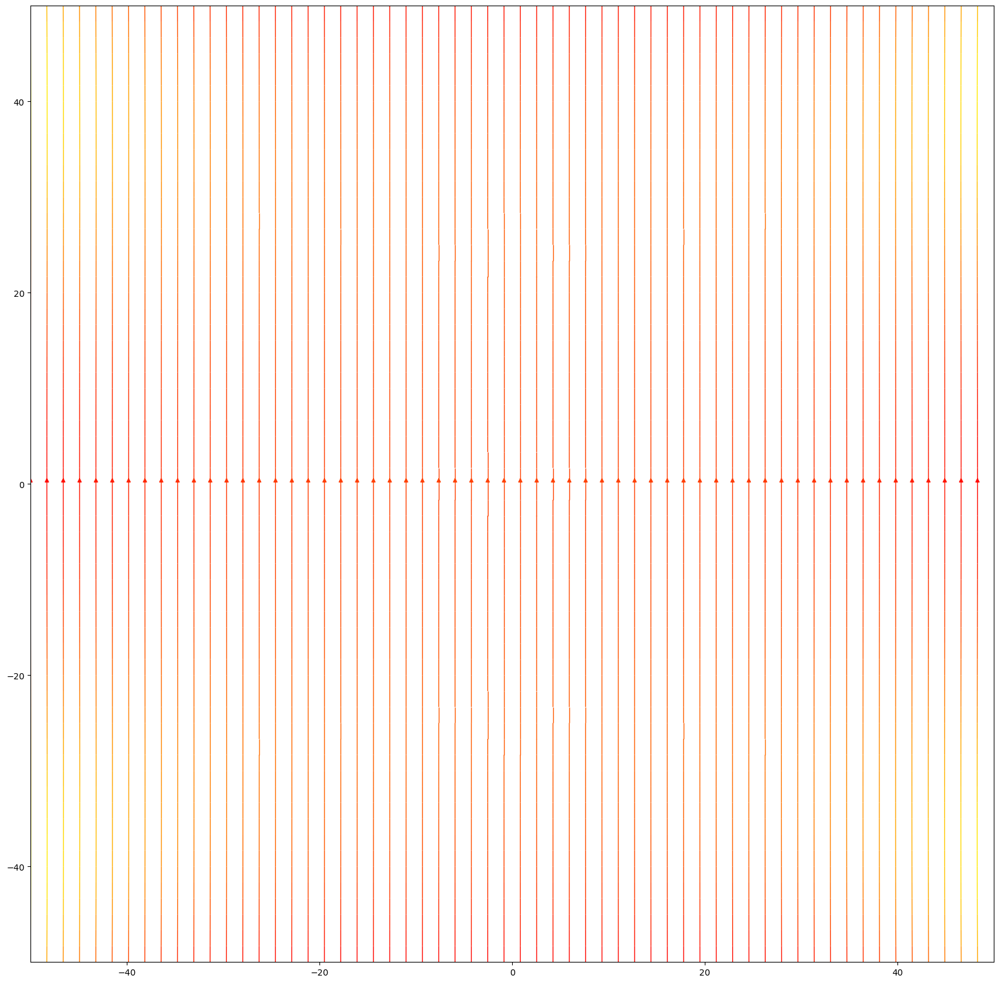

In [3]:
import numpy as np
import matplotlib.pyplot as plt
# B[:,50,:][0]
Bst = np.sqrt(B[:,50,:,0]**2 + B[:,50,:,1]**2 + B[:,50,:,2]**2)
# print(grid[:, 50, :, :])
# print(grid)
# print(grid[:, 50, :])
# print(B[:, 50, :, :])
# print(B[:, 50, :, 0])
print(np.linalg.norm(B, axis=3)[:, 50, :])
# print(np.mag(B, axis=3))
# print(np.sqrt(B.dot(B))[:, 50, :])
print(Bst)
j = 100
fig, ax1 = plt.subplots(1, 1, figsize=(20, 20))
ax1.streamplot(grid[:,j,:,0], grid[:,j,:,2], B[:,j,:,0], B[:,j,:,2], density=2,
        color=np.log(np.linalg.norm(B, axis=3)[:,j,:]), linewidth=1, cmap='autumn', broken_streamlines=False)

[[0.00165416 0.00163281 0.00160072 ... 0.00160072 0.00163281 0.00165416]
 [0.00143868 0.00143173 0.00141393 ... 0.00141393 0.00143173 0.00143868]
 [0.00123526 0.00124119 0.00123624 ... 0.00123624 0.00124119 0.00123526]
 ...
 [0.00123526 0.00124119 0.00123624 ... 0.00123624 0.00124119 0.00123526]
 [0.00143868 0.00143173 0.00141393 ... 0.00141393 0.00143173 0.00143868]
 [0.00165416 0.00163281 0.00160072 ... 0.00160072 0.00163281 0.00165416]]


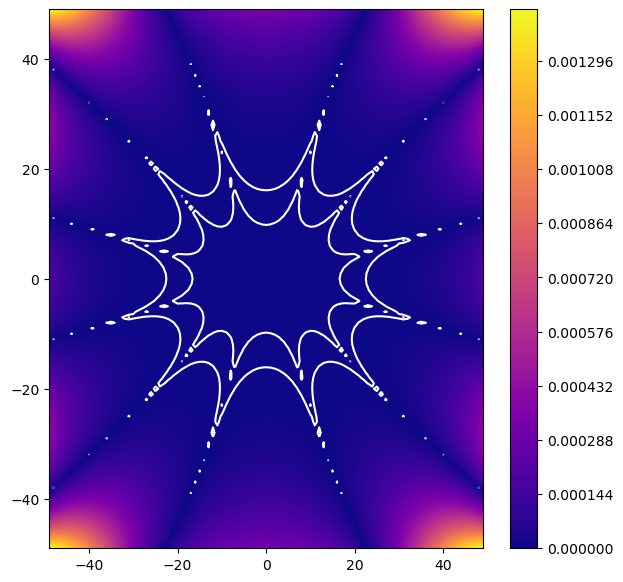

In [5]:
Bmag = np.linalg.norm(B, axis=3)
c = int(grid_res/2)
nonun = np.abs((Bmag - Bmag[c,c,c]) / Bmag[c,c,c])
print(nonun[:, 50, :])

plt.figure(figsize=(7,7))
s = 1
t = -s
ap_pl = plt.contourf(X[s:t], Z[s:t], nonun[s:t, 50, s:t], levels=1000, cmap=cm.plasma)
lvls = [1e-7, 1e-6]
cp = plt.contour(X[s:t], Z[s:t], nonun[s:t, 50, s:t], levels=lvls, colors='white')
plt.colorbar(ap_pl)

In [8]:
vuni = np.count_nonzero(nonun < 1e-6)
vbox = nonun.size

print(vuni / vbox * 100)

6.129956197266624


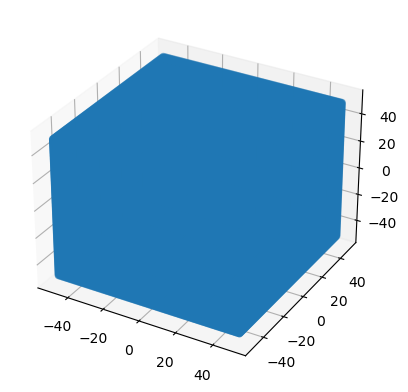

In [17]:
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
def scatter3d(x,y,z, cs, colorsMap='jet'):
    cmap = plt.get_cmap(colorsMap)
    cNorm = matplotlib.colors.Normalize(vmin=np.min(cs), vmax=np.max(cs))
    scalarMap = cm.ScalarMappable(norm=cNorm, cmap=cmap)
    fig = plt.figure()
#     ax = Axes3D(fig)
    ax.scatter(x, y, z, c=scalarMap.to_rgba(cs))
    scalarMap.set_array(cs)
    fig.colorbar(scalarMap)
    plt.show()
    
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(grid[:,:,:,0], grid[:,:,:,1], grid[:,:,:,2])

In [7]:
import numpy as np
ts_x = np.linspace(-d, d, 101)
ts_z = np.linspace(-h, h, 101)
grid_xz = np.array([[(x,0,z) for x in ts_x] for z in ts_z])
print(grid_xz)

B_xz = magpy.getB(magnets, grid_xz)

[[[-150.    0. -200.]
  [-147.    0. -200.]
  [-144.    0. -200.]
  ...
  [ 144.    0. -200.]
  [ 147.    0. -200.]
  [ 150.    0. -200.]]

 [[-150.    0. -196.]
  [-147.    0. -196.]
  [-144.    0. -196.]
  ...
  [ 144.    0. -196.]
  [ 147.    0. -196.]
  [ 150.    0. -196.]]

 [[-150.    0. -192.]
  [-147.    0. -192.]
  [-144.    0. -192.]
  ...
  [ 144.    0. -192.]
  [ 147.    0. -192.]
  [ 150.    0. -192.]]

 ...

 [[-150.    0.  192.]
  [-147.    0.  192.]
  [-144.    0.  192.]
  ...
  [ 144.    0.  192.]
  [ 147.    0.  192.]
  [ 150.    0.  192.]]

 [[-150.    0.  196.]
  [-147.    0.  196.]
  [-144.    0.  196.]
  ...
  [ 144.    0.  196.]
  [ 147.    0.  196.]
  [ 150.    0.  196.]]

 [[-150.    0.  200.]
  [-147.    0.  200.]
  [-144.    0.  200.]
  ...
  [ 144.    0.  200.]
  [ 147.    0.  200.]
  [ 150.    0.  200.]]]


In [23]:
print(B_xz)
# print(B_xz[:,:,0])
print(np.linalg.norm(B_xz, axis=2))

[[[ 1.90790214e-01 -2.33650625e-17  2.85174975e+00]
  [-1.86037493e-01  2.27830220e-17  2.68668171e+00]
  [-5.24198850e-01  6.41958444e-17  2.44885360e+00]
  ...
  [ 5.24198850e-01  0.00000000e+00  2.44885360e+00]
  [ 1.86037493e-01  0.00000000e+00  2.68668171e+00]
  [-1.90790214e-01  0.00000000e+00  2.85174975e+00]]

 [[-5.37797564e-03  6.58612065e-19  3.45612521e+00]
  [-5.04014827e-01  6.17240144e-17  3.22968873e+00]
  [-9.44938267e-01  1.15721562e-16  2.90527246e+00]
  ...
  [ 9.44938267e-01  0.00000000e+00  2.90527246e+00]
  [ 5.04014827e-01  0.00000000e+00  3.22968873e+00]
  [ 5.37797564e-03  0.00000000e+00  3.45612521e+00]]

 [[-2.78152468e-01  3.40638530e-17  4.25821700e+00]
  [-9.45221339e-01  1.15756229e-16  3.93921281e+00]
  [-1.52238658e+00  1.86438585e-16  3.48615438e+00]
  ...
  [ 1.52238658e+00  0.00000000e+00  3.48615438e+00]
  [ 9.45221339e-01  0.00000000e+00  3.93921281e+00]
  [ 2.78152468e-01  0.00000000e+00  4.25821700e+00]]

 ...

 [[ 2.78152468e-01 -3.40638530e-17

In [ ]:
import numpy as np
from scipy.optimize import minimize, Bounds
from maghelper import get_field_on_axes, get_nonuniformity, make_flux_stream, centered_sweep_range, make_grid
# get_grid_nonuniformity,
from maggeometry import four_rings
import magpylib as magpy
from magpylib.magnet import CylinderSegment
from alive_progress import alive_bar
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def make_xyz_grid(x_grid_bounds, y_grid_bounds, z_grid_bounds, grid_res):
    ts_x = np.linspace(x_grid_bounds[0], x_grid_bounds[1], grid_res)
    ts_y = np.linspace(y_grid_bounds[0], y_grid_bounds[1], grid_res)
    ts_z = np.linspace(z_grid_bounds[0], z_grid_bounds[1], grid_res)
    grid = np.array([[[(x,y,z) for x in ts_x] for y in ts_y]for z in ts_z])
    return ts_x, ts_y, ts_z, grid
d = 150
h = 200
b = 150
grid_res = 1001
X, Y, Z, grid_fine = make_xyz_grid([-d, d], [-b, b], [-h, h], grid_res)
Br = 1.09e3
x = [144.38226051, 51.11048466, 19.94272085, 2, 155.70613803, 183.10542199]

innerrad1, innerrad2, width, thickness, dist1, dist2 = x
magnets = four_rings(Br, innerrad1, innerrad2, width, thickness, dist1, dist2)

B = magpy.getB(magnets, grid)
# print(B)
B.shape

/opt/homebrew/anaconda3/envs/pqe/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


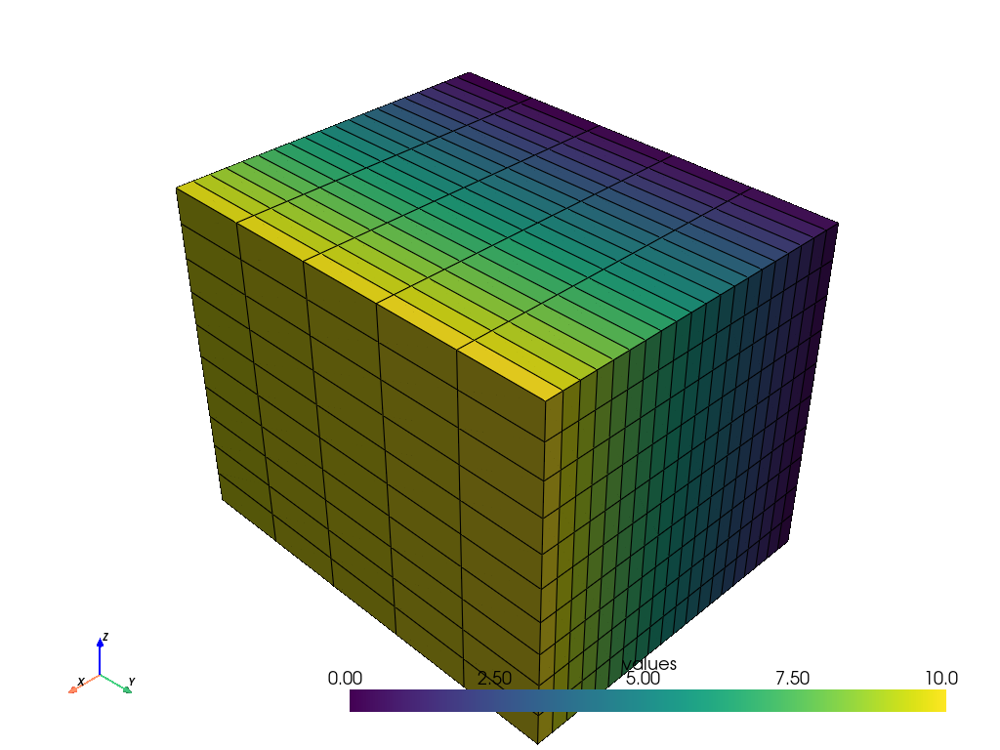

In [3]:
import numpy as np
import pyvista as pv
values = np.linspace(0, 10, 1000).reshape((20, 5, 10))
values.shape

# Create the spatial reference
grid = pv.ImageData()

# Set the grid dimensions: shape + 1 because we want to inject our values on
#   the CELL data
grid.dimensions = np.array(values.shape) + 1

# Edit the spatial reference
grid.origin = (100, 33, 55.6)  # The bottom left corner of the data set
grid.spacing = (1, 5, 2)  # These are the cell sizes along each axis

# Add the data values to the cell data
grid.cell_data["values"] = values.flatten(order="F")  # Flatten the array

# Now plot the grid
grid.plot(show_edges=True)

In [4]:
import numpy as np
u_v = np.pi * 2.153**2 * 0.704
print(f"Uniform volume: {round(u_v, 3)} cm^3")

# Remember to convert to cm^3 with the factor of 1000
s_v = np.pi * innerrad1**2 * (2*dist2) / 1000
print(f"Structure enclosed volume: {round(s_v, 3)} cm^3")

r = u_v/s_v * 100

print(f"Uniform proportion: {round(r, 5)}%")

Uniform volume: 10.252 cm^3
Structure enclosed volume: 8512.402 cm^3
Uniform proportion: 0.12044%
